# Xiyue Zhang
"On my honor, as a student, I have neither given nor received unauthorized aid on this academic work." 

# 1. The contents from my mid-term projec

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

#regression packages
import sklearn.linear_model as lm
from sklearn.metrics import mean_squared_error
from sklearn.metrics import explained_variance_score

#lasso regression
from sklearn import linear_model

#f_regression (feature selection)
from sklearn.feature_selection import f_regression
from sklearn.feature_selection import SelectKBest

# recursive feature selection (feature selection)
from sklearn.feature_selection import RFE

import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.model_selection import train_test_split
from scipy import stats

In [2]:
df = pd.read_csv('movie_metadata.csv')
df.head()

,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,...,num_user_for_reviews,language,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
0,Color,James Cameron,723.0,178.0,0.0,855.0,Joel David Moore,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,...,3054.0,English,USA,PG-13,237000000.0,2009.0,936.0,7.9,1.78,33000
1,Color,Gore Verbinski,302.0,169.0,563.0,1000.0,Orlando Bloom,40000.0,309404152.0,Action|Adventure|Fantasy,...,1238.0,English,USA,PG-13,300000000.0,2007.0,5000.0,7.1,2.35,0
2,Color,Sam Mendes,602.0,148.0,0.0,161.0,Rory Kinnear,11000.0,200074175.0,Action|Adventure|Thriller,...,994.0,English,UK,PG-13,245000000.0,2015.0,393.0,6.8,2.35,85000
3,Color,Christopher Nolan,813.0,164.0,22000.0,23000.0,Christian Bale,27000.0,448130642.0,Action|Thriller,...,2701.0,English,USA,PG-13,250000000.0,2012.0,23000.0,8.5,2.35,164000
4,NaN,Doug Walker,NaN,NaN,131.0,NaN,Rob Walker,131.0,NaN,Documentary,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,7.1,NaN,0


## 1.1 Business & data understanding & Data processing

### 1.1.1 Identify data types

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5043 entries, 0 to 5042
Data columns (total 28 columns):
color                        5024 non-null object
director_name                4939 non-null object
num_critic_for_reviews       4993 non-null float64
duration                     5028 non-null float64
director_facebook_likes      4939 non-null float64
actor_3_facebook_likes       5020 non-null float64
actor_2_name                 5030 non-null object
actor_1_facebook_likes       5036 non-null float64
gross                        4159 non-null float64
genres                       5043 non-null object
actor_1_name                 5036 non-null object
movie_title                  5043 non-null object
num_voted_users              5043 non-null int64
cast_total_facebook_likes    5043 non-null int64
actor_3_name                 5020 non-null object
facenumber_in_poster         5030 non-null float64
plot_keywords                4890 non-null object
movie_imdb_link              5043 non-

### 1.1.2 Describe data

In [4]:
# Basic statistics
df.describe()

,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_1_facebook_likes,gross,num_voted_users,cast_total_facebook_likes,facenumber_in_poster,num_user_for_reviews,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
count,4993.000000,5028.000000,4939.000000,5020.000000,5036.000000,4.159000e+03,5.043000e+03,5043.000000,5030.000000,5022.000000,4.551000e+03,4935.000000,5030.000000,5043.000000,4714.000000,5043.000000
mean,140.194272,107.201074,686.509212,645.009761,6560.047061,4.846841e+07,8.366816e+04,9699.063851,1.371173,272.770808,3.975262e+07,2002.470517,1651.754473,6.442138,2.220403,7525.964505
std,121.601675,25.197441,2813.328607,1665.041728,15020.759120,6.845299e+07,1.384853e+05,18163.799124,2.013576,377.982886,2.061149e+08,12.474599,4042.438863,1.125116,1.385113,19320.445110
min,1.000000,7.000000,0.000000,0.000000,0.000000,1.620000e+02,5.000000e+00,0.000000,0.000000,1.000000,2.180000e+02,1916.000000,0.000000,1.600000,1.180000,0.000000
25%,50.000000,93.000000,7.000000,133.000000,614.000000,5.340988e+06,8.593500e+03,1411.000000,0.000000,65.000000,6.000000e+06,1999.000000,281.000000,5.800000,1.850000,0.000000
50%,110.000000,103.000000,49.000000,371.500000,988.000000,2.551750e+07,3.435900e+04,3090.000000,1.000000,156.000000,2.000000e+07,2005.000000,595.000000,6.600000,2.350000,166.000000
75%,195.000000,118.000000,194.500000,636.000000,11000.000000,6.230944e+07,9.630900e+04,13756.500000,2.000000,326.000000,4.500000e+07,2011.000000,918.000000,7.200000,2.350000,3000.000000
max,813.000000,511.000000,23000.000000,23000.000000,640000.000000,7.605058e+08,1.689764e+06,656730.000000,43.000000,5060.000000,1.221550e+10,2016.000000,137000.000000,9.500000,16.000000,349000.000000


### 1.1.3 Remove Duplicates

In [5]:
len(df[df.duplicated()])

45

In [6]:
len(df)

5043

In [7]:
df = df.drop_duplicates()
len(df)

4998

### 1.1.4 Drop Columns

In [8]:
df.groupby('color').size()

color
 Black and White     207
Color               4772
dtype: int64

In [9]:
df = df.drop(['color'], axis=1)

Almost movies are colored, so we can drop column "color".

In [10]:
df.groupby('language').size().sort_values(ascending=False).head()

language
English     4662
French        73
Spanish       40
Hindi         28
Mandarin      24
dtype: int64

In [11]:
df = df.drop(['language'], axis=1)

Almost movies are English, so we can drop column "language".

In [12]:
df.groupby('country').size().sort_values(ascending=False).head()

country
USA        3773
UK          443
France      154
Canada      124
Germany      96
dtype: int64

In [13]:
def f(x):
    if x == 'USA': return 'USA'
    elif x == 'UK': return 'UK'
    else: return 'others'
df['country'] = df['country'].apply(f)

Since almost movies from "USA" & "UK", we replace other country to "others"

In [14]:
df = df.drop(['actor_3_facebook_likes', 'plot_keywords'], axis=1)

Since these variables don't affect the result a lot, so I also drop it.

### 1.1.5 Identify&Handle data quality issues

In [15]:
df.isnull().sum().sort_values(ascending=False)

gross                        874
budget                       487
aspect_ratio                 327
content_rating               301
title_year                   107
director_name                103
director_facebook_likes      103
num_critic_for_reviews        49
actor_3_name                  23
num_user_for_reviews          21
duration                      15
actor_2_facebook_likes        13
facenumber_in_poster          13
actor_2_name                  13
actor_1_facebook_likes         7
actor_1_name                   7
movie_facebook_likes           0
genres                         0
movie_title                    0
num_voted_users                0
movie_imdb_link                0
country                        0
imdb_score                     0
cast_total_facebook_likes      0
dtype: int64

In [16]:
df['gross'].fillna(df['gross'].mean(), inplace=True)
df['budget'].fillna(df['budget'].mean(), inplace=True)
df['aspect_ratio'].fillna(df['aspect_ratio'].mean(), inplace=True)
df['content_rating'].fillna('Unrated', inplace=True)
df['title_year'].fillna(0, inplace=True)

In [17]:
df.groupby('director_facebook_likes').size().sort_values(ascending=False).head(5)

director_facebook_likes
0.0    897
3.0     70
6.0     66
7.0     64
2.0     63
dtype: int64

We can find that the most director_facebook_likes scores are equal to 0, so I decide to choose 0 to replace missing values.

In [18]:
df['director_facebook_likes'].fillna(0, inplace=True)

In [19]:
## Check content ratings
df.groupby('content_rating').size().sort_values(ascending=False)

content_rating
R            2098
PG-13        1444
PG            698
Unrated       361
Not Rated     116
G             112
Approved       55
TV-14          30
TV-MA          19
X              13
TV-PG          13
TV-G           10
Passed          9
NC-17           7
GP              6
M               5
TV-Y            1
TV-Y7           1
dtype: int64

In [20]:
df = df.replace('Not Rated', 'Unrated')

In [21]:
df.dropna(inplace=True)

In [22]:
df.isnull().sum().sort_values(ascending=False)

movie_facebook_likes         0
aspect_ratio                 0
num_critic_for_reviews       0
duration                     0
director_facebook_likes      0
actor_2_name                 0
actor_1_facebook_likes       0
gross                        0
genres                       0
actor_1_name                 0
movie_title                  0
num_voted_users              0
cast_total_facebook_likes    0
actor_3_name                 0
facenumber_in_poster         0
movie_imdb_link              0
num_user_for_reviews         0
country                      0
content_rating               0
budget                       0
title_year                   0
actor_2_facebook_likes       0
imdb_score                   0
director_name                0
dtype: int64

In [23]:
len(df)

4814

### 1.1.6 Creat New Columns

In [24]:
df['profit'] = df['gross'] - df['budget']

df.head()

,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,actor_1_name,movie_title,...,num_user_for_reviews,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes,profit
0,James Cameron,723.0,178.0,0.0,Joel David Moore,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,CCH Pounder,Avatar,...,3054.0,USA,PG-13,237000000.0,2009.0,936.0,7.9,1.78,33000,523505847.0
1,Gore Verbinski,302.0,169.0,563.0,Orlando Bloom,40000.0,309404152.0,Action|Adventure|Fantasy,Johnny Depp,Pirates of the Caribbean: At World's End,...,1238.0,USA,PG-13,300000000.0,2007.0,5000.0,7.1,2.35,0,9404152.0
2,Sam Mendes,602.0,148.0,0.0,Rory Kinnear,11000.0,200074175.0,Action|Adventure|Thriller,Christoph Waltz,Spectre,...,994.0,UK,PG-13,245000000.0,2015.0,393.0,6.8,2.35,85000,-44925825.0
3,Christopher Nolan,813.0,164.0,22000.0,Christian Bale,27000.0,448130642.0,Action|Thriller,Tom Hardy,The Dark Knight Rises,...,2701.0,USA,PG-13,250000000.0,2012.0,23000.0,8.5,2.35,164000,198130642.0
5,Andrew Stanton,462.0,132.0,475.0,Samantha Morton,640.0,73058679.0,Action|Adventure|Sci-Fi,Daryl Sabara,John Carter,...,738.0,USA,PG-13,263700000.0,2012.0,632.0,6.6,2.35,24000,-190641321.0


In [25]:
# Creat variable "return" to calculate percentage return on investment
df['return'] = (df['profit']/df['budget'])*100

df.head()

,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,actor_1_name,movie_title,...,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes,profit,return
0,James Cameron,723.0,178.0,0.0,Joel David Moore,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,CCH Pounder,Avatar,...,USA,PG-13,237000000.0,2009.0,936.0,7.9,1.78,33000,523505847.0,220.888543
1,Gore Verbinski,302.0,169.0,563.0,Orlando Bloom,40000.0,309404152.0,Action|Adventure|Fantasy,Johnny Depp,Pirates of the Caribbean: At World's End,...,USA,PG-13,300000000.0,2007.0,5000.0,7.1,2.35,0,9404152.0,3.134717
2,Sam Mendes,602.0,148.0,0.0,Rory Kinnear,11000.0,200074175.0,Action|Adventure|Thriller,Christoph Waltz,Spectre,...,UK,PG-13,245000000.0,2015.0,393.0,6.8,2.35,85000,-44925825.0,-18.337071
3,Christopher Nolan,813.0,164.0,22000.0,Christian Bale,27000.0,448130642.0,Action|Thriller,Tom Hardy,The Dark Knight Rises,...,USA,PG-13,250000000.0,2012.0,23000.0,8.5,2.35,164000,198130642.0,79.252257
5,Andrew Stanton,462.0,132.0,475.0,Samantha Morton,640.0,73058679.0,Action|Adventure|Sci-Fi,Daryl Sabara,John Carter,...,USA,PG-13,263700000.0,2012.0,632.0,6.6,2.35,24000,-190641321.0,-72.294775


### 1.1.7 Correlation analysis

In [26]:
df.corr()

,num_critic_for_reviews,duration,director_facebook_likes,actor_1_facebook_likes,gross,num_voted_users,cast_total_facebook_likes,facenumber_in_poster,num_user_for_reviews,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes,profit,return
num_critic_for_reviews,1.000000,0.249395,0.181410,0.185403,0.442266,0.622104,0.256612,-0.031582,0.603897,0.115548,0.281410,0.278426,0.336483,0.037608,0.686920,0.022538,-0.025924
duration,0.249395,1.000000,0.172777,0.080739,0.228310,0.338070,0.116865,0.029499,0.351799,0.070628,-0.134185,0.133527,0.352489,0.057603,0.211064,0.000845,-0.046571
director_facebook_likes,0.181410,0.172777,1.000000,0.090319,0.140745,0.299354,0.119466,-0.040954,0.222752,0.020487,-0.063474,0.120290,0.174131,0.002452,0.163177,0.023175,-0.008651
actor_1_facebook_likes,0.185403,0.080739,0.090319,1.000000,0.139343,0.187559,0.952601,0.074291,0.140644,0.021336,0.089134,0.387656,0.085111,0.015912,0.133131,0.021910,-0.016982
gross,0.442266,0.228310,0.140745,0.139343,1.000000,0.614598,0.222285,-0.029211,0.540838,0.099859,0.021789,0.250258,0.174215,0.029362,0.359011,0.209573,0.004405
num_voted_users,0.622104,0.338070,0.299354,0.187559,0.614598,1.000000,0.256810,-0.029069,0.796931,0.076853,0.011865,0.262649,0.433132,0.017870,0.531728,0.113591,-0.016889
cast_total_facebook_likes,0.256612,0.116865,0.119466,0.952601,0.222285,0.256810,1.000000,0.093130,0.199849,0.034271,0.113130,0.624629,0.095483,0.020439,0.203889,0.034719,-0.020662
facenumber_in_poster,-0.031582,0.029499,-0.040954,0.074291,-0.029211,-0.029069,0.093130,1.000000,-0.069982,-0.019357,0.059874,0.072450,-0.066749,0.014283,0.007846,0.010034,-0.018170
num_user_for_reviews,0.603897,0.351799,0.222752,0.140644,0.540838,0.796931,0.199849,-0.069982,1.000000,0.081982,0.001184,0.213898,0.310254,0.016247,0.395559,0.085855,-0.006455
budget,0.115548,0.070628,0.020487,0.021336,0.099859,0.076853,0.034271,-0.019357,0.081982,1.000000,0.044300,0.042308,0.029901,0.008116,0.058642,-0.951978,-0.008643


### 1.1.8 Creat Bins for imdb_score

In [27]:
df1 = df

df1['imdbscores_bins'] = pd.cut(df['imdb_score'], bins=[0, 4, 6, 8, float('Inf')], labels=['bad', 'OK', 'good', 'excellent'])

df1.head()
# https://stackoverflow.com/questions/32633977/how-to-create-categorical-variable-based-on-a-numerical-variable

,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,actor_1_name,movie_title,...,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes,profit,return,imdbscores_bins
0,James Cameron,723.0,178.0,0.0,Joel David Moore,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,CCH Pounder,Avatar,...,PG-13,237000000.0,2009.0,936.0,7.9,1.78,33000,523505847.0,220.888543,good
1,Gore Verbinski,302.0,169.0,563.0,Orlando Bloom,40000.0,309404152.0,Action|Adventure|Fantasy,Johnny Depp,Pirates of the Caribbean: At World's End,...,PG-13,300000000.0,2007.0,5000.0,7.1,2.35,0,9404152.0,3.134717,good
2,Sam Mendes,602.0,148.0,0.0,Rory Kinnear,11000.0,200074175.0,Action|Adventure|Thriller,Christoph Waltz,Spectre,...,PG-13,245000000.0,2015.0,393.0,6.8,2.35,85000,-44925825.0,-18.337071,good
3,Christopher Nolan,813.0,164.0,22000.0,Christian Bale,27000.0,448130642.0,Action|Thriller,Tom Hardy,The Dark Knight Rises,...,PG-13,250000000.0,2012.0,23000.0,8.5,2.35,164000,198130642.0,79.252257,excellent
5,Andrew Stanton,462.0,132.0,475.0,Samantha Morton,640.0,73058679.0,Action|Adventure|Sci-Fi,Daryl Sabara,John Carter,...,PG-13,263700000.0,2012.0,632.0,6.6,2.35,24000,-190641321.0,-72.294775,good


In [28]:
df.groupby('imdbscores_bins').size().sort_values(ascending=False)

imdbscores_bins
good         3068
OK           1374
excellent     208
bad           164
dtype: int64

In [29]:
# save data
df.to_csv("imdb_score.csv",index=False)

## 1.2 Business intelligence & Data Visualization

In [30]:
import plotly.graph_objects as go
import plotly.express as px

In [31]:
movie = pd.read_csv('imdb_score.csv')
movie.head(2)

,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,actor_1_name,movie_title,...,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes,profit,return,imdbscores_bins
0,James Cameron,723.0,178.0,0.0,Joel David Moore,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,CCH Pounder,Avatar,...,PG-13,237000000.0,2009.0,936.0,7.9,1.78,33000,523505847.0,220.888543,good
1,Gore Verbinski,302.0,169.0,563.0,Orlando Bloom,40000.0,309404152.0,Action|Adventure|Fantasy,Johnny Depp,Pirates of the Caribbean: At World's End,...,PG-13,300000000.0,2007.0,5000.0,7.1,2.35,0,9404152.0,3.134717,good


In [32]:
len(movie)

4814

### 1.2.1 Histogram of imdb_score

In [33]:
imdbs = px.histogram(movie, x="imdb_score",title="Histogram of IMDB Score")
imdbs.show()

Only few movies have rating larger than 8.0.

### 1.2.2 The Relationship Between Title year and Imdb score

In [34]:
px.violin(movie, y="title_year", x="imdbscores_bins", title = "The Relationship between year and imdb score", box=True, points="all", hover_data=movie.columns)

According to these graphs above, we can conclude that: the older the years in which the movies are released, the more high scores the movies get.

### 1.2.3 The Relationship between Profit and Imdb_score

In [35]:
top1 = df.sort_values('profit', ascending = False).head(20)
top1.head(2)

,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,actor_1_name,movie_title,...,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes,profit,return,imdbscores_bins
0,James Cameron,723.0,178.0,0.0,Joel David Moore,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,CCH Pounder,Avatar,...,PG-13,237000000.0,2009.0,936.0,7.9,1.78,33000,523505847.0,220.888543,good
29,Colin Trevorrow,644.0,124.0,365.0,Judy Greer,3000.0,652177271.0,Action|Adventure|Sci-Fi|Thriller,Bryce Dallas Howard,Jurassic World,...,PG-13,150000000.0,2015.0,2000.0,7.0,2.00,150000,502177271.0,334.784847,good


In [36]:
px.scatter(top1, x="profit", y="imdb_score",size="budget",text='movie_title',title='Top 20 Profitable Movies', trendline='lowess')

The graph made by plotly express is not direct enough to show the relationship between "profit" and "imdb_score", so I creat a linear regression & scatter chart for them.

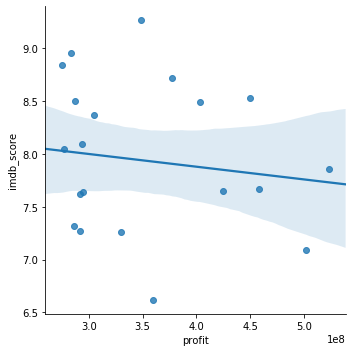

In [37]:
sns.lmplot("profit", "imdb_score", top1, y_jitter=0.40, x_jitter=.40);

According to these graphs above, we can conclude that "profit" and "imdb_score" have a negative relationship which means that the number of "profit" increases as the number of "imdb_score" decreases.

### 1.2.4 The Relationship between Return and Imdb_score

In [38]:
top2 = df.sort_values('return', ascending = False).head(20)
top2.head(2)

,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,actor_1_name,movie_title,...,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes,profit,return,imdbscores_bins
5040,Benjamin Roberds,13.0,76.0,0.0,Maxwell Moody,0.0,4.832565e+07,Drama|Horror|Thriller,Eva Boehnke,A Plague So Pleasant,...,Unrated,1400.0,2013.0,0.0,6.3,2.221417,16,4.832425e+07,3.451732e+06,good
4793,Oren Peli,409.0,84.0,110.0,Ashley Palmer,189.0,1.079173e+08,Horror,Micah Sloat,Paranormal Activity,...,R,15000.0,2007.0,109.0,6.3,1.850000,12000,1.079023e+08,7.193486e+05,good


In [39]:
px.scatter(top2, x="return", y="imdb_score", size="budget", text='movie_title',title='Top 20 Movies Base on Return on Investment', trendline='lowess')

Return means return on investment, and "return" = (profit/budget)*100.

According to the graph, we can conclude that "return" and "imdb_score" have a negative relationship which means that the number of "return" increases as the number of "imdb_score" decreases.

### 1.2.5 Commercial Success v.s. Critical Acclaim

In [40]:
px.scatter(top1, x="gross", y="imdb_score",size="profit",text='movie_title',title='Commercial Success v.s. Critical Acclaim', trendline='lowess')

According to the graph, we can conclude that "gross" and "imdb_score" have a negative relationship which means that the number of "gross" increases as the number of "imdb_score" decreases in top 20 profitable firms. So, the movies that get good score often don't do well in commerce.

### 1.2.6 The Relationship between Facebook like and Imdb_score

In [41]:
px.scatter(movie, x="movie_facebook_likes", y="imdb_score",text='movie_title',title='The Relationship between Facebook like and Imdb_score')

According to this chart we can find that movies with a high Facebook like tend to have a high imdb score, while those with a low Facebook like may have a high score or a low score.

### 1.2.7 Commercial Director v.s. High Imdb_score Director

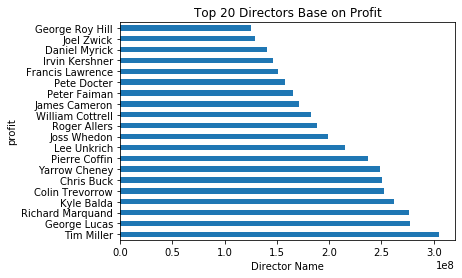

In [42]:
diretor1 = movie.groupby('director_name')['profit'].mean().sort_values(ascending=False).head(20)

diretor1.plot(kind='barh');
plt.xlabel('Director Name')
plt.ylabel('profit')
plt.title("Top 20 Directors Base on Profit");

This bar chart shows the top 20 directors base on profit.

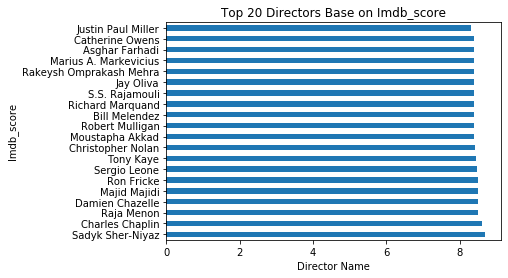

In [43]:
diretor = movie.groupby('director_name')['imdb_score'].mean().sort_values(ascending=False).head(20)

diretor.plot(kind='barh');
plt.xlabel('Director Name')
plt.ylabel('Imdb_score')
plt.title("Top 20 Directors Base on Imdb_score");

This bar chart shows the top 20 directors base on imdb_score.

According these two bar charts, the directors who do well in business are likely to have a poor imdb score.

### 1.2.8 Commercial First Actor v.s. High Imdb_score Actor

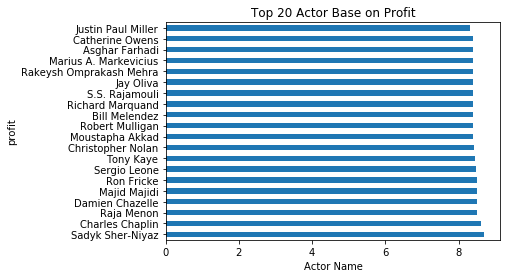

In [44]:
actor1 = movie.groupby('actor_1_name')['profit'].mean().sort_values(ascending=False).head(20)

diretor.plot(kind='barh');
plt.xlabel('Actor Name')
plt.ylabel('profit')
plt.title("Top 20 Actor Base on Profit");

This bar chart shows the top 20 actors base on profit.

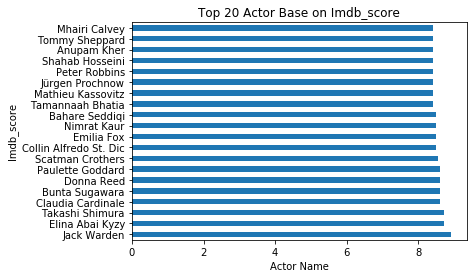

In [45]:
actor = movie.groupby('actor_1_name')['imdb_score'].mean().sort_values(ascending=False).head(20)

actor.plot(kind='barh');
plt.xlabel('Actor Name')
plt.ylabel('Imdb_score')
plt.title("Top 20 Actor Base on Imdb_score");

This bar chart shows the top 20 actors base on imdb_score.

According these two bar charts, the actors who do well in business are likely to have a poor imdb score.

## 1.3 Exploratory data analysis

### 1.3.1 correlation analysis & heatmap

In [46]:
movie = pd.read_csv('imdb_score.csv')
movie.head(2)

,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,actor_1_name,movie_title,...,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes,profit,return,imdbscores_bins
0,James Cameron,723.0,178.0,0.0,Joel David Moore,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,CCH Pounder,Avatar,...,PG-13,237000000.0,2009.0,936.0,7.9,1.78,33000,523505847.0,220.888543,good
1,Gore Verbinski,302.0,169.0,563.0,Orlando Bloom,40000.0,309404152.0,Action|Adventure|Fantasy,Johnny Depp,Pirates of the Caribbean: At World's End,...,PG-13,300000000.0,2007.0,5000.0,7.1,2.35,0,9404152.0,3.134717,good


1. To avoid multicollinearity, we delete the variables we created before doing the correlation analysis.
2. And columns "imdb_sore" & "imdbscore_bin" are similar, we keep "imdbscore_bin" for following analysis expediently.

In [47]:
# Drop columns
movie = movie.drop(['profit','return','imdb_score'], axis=1)

In [48]:
movie.corr()

,num_critic_for_reviews,duration,director_facebook_likes,actor_1_facebook_likes,gross,num_voted_users,cast_total_facebook_likes,facenumber_in_poster,num_user_for_reviews,budget,title_year,actor_2_facebook_likes,aspect_ratio,movie_facebook_likes
num_critic_for_reviews,1.000000,0.249395,0.181410,0.185403,0.442266,0.622104,0.256612,-0.031582,0.603897,0.115548,0.281410,0.278426,0.037608,0.686920
duration,0.249395,1.000000,0.172777,0.080739,0.228310,0.338070,0.116865,0.029499,0.351799,0.070628,-0.134185,0.133527,0.057603,0.211064
director_facebook_likes,0.181410,0.172777,1.000000,0.090319,0.140745,0.299354,0.119466,-0.040954,0.222752,0.020487,-0.063474,0.120290,0.002452,0.163177
actor_1_facebook_likes,0.185403,0.080739,0.090319,1.000000,0.139343,0.187559,0.952601,0.074291,0.140644,0.021336,0.089134,0.387656,0.015912,0.133131
gross,0.442266,0.228310,0.140745,0.139343,1.000000,0.614598,0.222285,-0.029211,0.540838,0.099859,0.021789,0.250258,0.029362,0.359011
num_voted_users,0.622104,0.338070,0.299354,0.187559,0.614598,1.000000,0.256810,-0.029069,0.796931,0.076853,0.011865,0.262649,0.017870,0.531728
cast_total_facebook_likes,0.256612,0.116865,0.119466,0.952601,0.222285,0.256810,1.000000,0.093130,0.199849,0.034271,0.113130,0.624629,0.020439,0.203889
facenumber_in_poster,-0.031582,0.029499,-0.040954,0.074291,-0.029211,-0.029069,0.093130,1.000000,-0.069982,-0.019357,0.059874,0.072450,0.014283,0.007846
num_user_for_reviews,0.603897,0.351799,0.222752,0.140644,0.540838,0.796931,0.199849,-0.069982,1.000000,0.081982,0.001184,0.213898,0.016247,0.395559
budget,0.115548,0.070628,0.020487,0.021336,0.099859,0.076853,0.034271,-0.019357,0.081982,1.000000,0.044300,0.042308,0.008116,0.058642


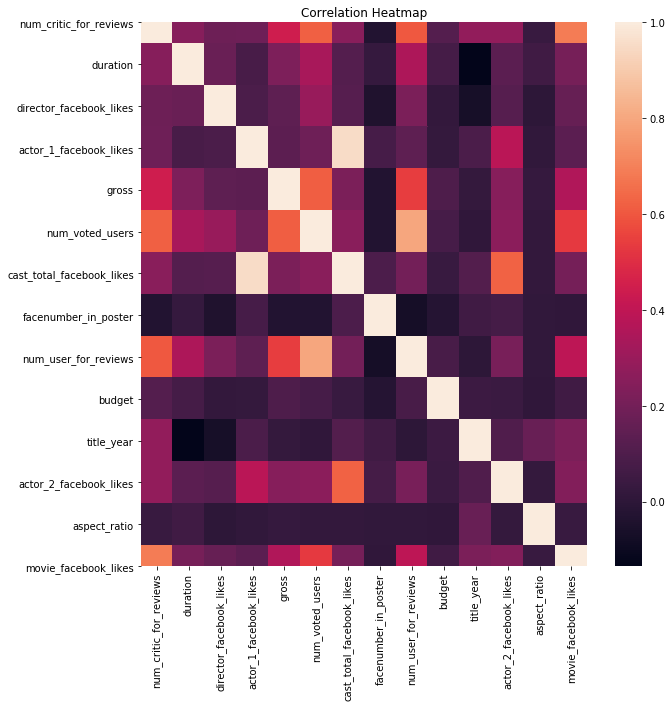

In [49]:
plt.figure(figsize=(10,10))
sns.heatmap(movie.corr())
plt.title("Correlation Heatmap");

Conclusion:
1. Variables which are positive related to imdb score: num_critic_for_reviews, duration, director_facebook_likes, actor_1_facebook_like, gross, num_voted_users, cast_total_facebook_likes,	num_user_for_reviews, budget, actor_2_facebook_likes, aspect_ratio, movie_facebook_likes;
2. Variables which are negative related to imdb score:facenumber_in_poster, title_year.
3. actor_1_facebook_likes has a very high positive relationship with cast_total_facebook_likes.
4. num_user_for_reviews is highly positive related to num_voted_users.
5. title_year has a high negative relationship with duration.
6. title_year has a very high negative relationship with imdb score.

In [50]:
movie.groupby('imdbscores_bins').mean()

,num_critic_for_reviews,duration,director_facebook_likes,actor_1_facebook_likes,gross,num_voted_users,cast_total_facebook_likes,facenumber_in_poster,num_user_for_reviews,budget,title_year,actor_2_facebook_likes,aspect_ratio,movie_facebook_likes
imdbscores_bins,,,,,,,,,,,,,,
OK,101.930131,100.401019,239.839156,5514.502183,3.840444e+07,33995.420670,8345.861718,1.518923,175.151383,3.503970e+07,2004.815138,1313.302038,2.130243,3064.111354
bad,53.615854,93.810976,85.109756,3769.823171,3.001394e+07,15157.201220,5510.286585,1.500000,136.195122,2.110973e+07,2005.743902,679.804878,2.119336,1689.323171
excellent,233.495192,131.788462,3146.072115,9429.668269,9.498448e+07,425821.134615,14283.831731,0.932692,854.668269,5.226790e+07,1991.216346,2545.163462,2.023028,32013.139423
good,159.646023,111.142764,772.357562,7263.664276,5.077720e+07,89697.774120,10593.990222,1.310626,293.244785,4.258368e+07,2001.842894,1847.581486,2.132646,8319.671447


Here are the characteristics of movies with high imdb score:
1. Higher number of critical reviews on imdb 
2. Higher duration
3. Higher Facebook likes
4. Higher number of voted users
5. Higher number of users for review
6. The older year in which the movie is released
7. Lower number of the actor who featured in the movie poster  
8. Higher aspect ratio the movie was made in 

### 1.3.2  Statistical hypothesis tests 

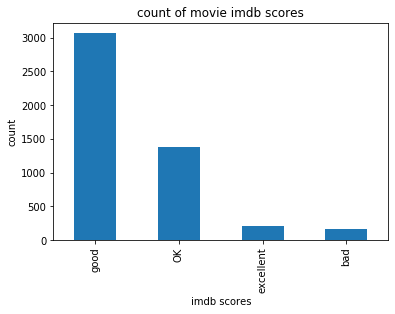

In [51]:
movie['imdbscores_bins'].value_counts().plot(kind='bar')
plt.xlabel('imdb scores')
plt.ylabel('count')
plt.title("count of movie imdb scores");

The most movies' scores are 4 or 3.

In [52]:
ex = movie[movie['imdbscores_bins'] == 'excellent']['num_voted_users']
g = movie[movie['imdbscores_bins'] == 'good']['num_voted_users']
o = movie[movie['imdbscores_bins'] == 'OK']['num_voted_users']
b = movie[movie['imdbscores_bins'] == 'bad']['num_voted_users']

f_val, p_val = stats.f_oneway(ex,g,o,b)  
  
print("One-way ANOVA P =", p_val)

One-way ANOVA P = 0.0


num_voted_users appear to be different by imdbscores_bins

In [53]:
ex = movie[movie['imdbscores_bins'] == 'excellent']['movie_facebook_likes']
g = movie[movie['imdbscores_bins'] == 'good']['movie_facebook_likes']
o = movie[movie['imdbscores_bins'] == 'OK']['movie_facebook_likes']
b = movie[movie['imdbscores_bins'] == 'bad']['movie_facebook_likes']

f_val, p_val = stats.f_oneway(ex,g,o,b)  
  
print("One-way ANOVA P =", p_val)

One-way ANOVA P = 1.2992983792937873e-95


movie_facebook_likes appear to be different by imdbscores_bins

## 1.4 Storytelling

After finishing all analysis, we have some conclusions and some of them will be interesting:
1. There are some useful findings for all values:
   
    1) The older the years in which the movies are released, the more high scores the movies get.
    
    2) Movies with a high Facebook like tend to have a high imdb score, while those with a low Facebook like may have a high score or a low score.
    
    3) The directors who can get a great imdb score don’t mean they can make a lot of profit for company.
   
    4) The actors who can get a great imdb score also don’t mean they can make a lot of profit for company.

2. There are some data that are relatively important for measure a movie’s success: num_critic_for_reviews, num_voted_users, duration, num_user_for_reviews and movie_facebook_likes

3. There are some variable have very strong relationship:

    1) actor_1_facebook_likes has a very high positive relationship with cast_total_facebook_likes.

    2) num_user_for_reviews is highly positive related to num_voted_users.

    3) title_year has a high negative relationship with duration.

    4) title_year has a very high negative relationship with imdb score.

4. Here are the characteristics of movies with high imdb score:
    
    1)	Higher number of critical reviews on imdb 
    
    2)	Higher duration
    
    3)	Higher Facebook likes
    
    4)	Higher number of voted users
    
    5)	Higher number of users for review
    
    6)	The older year in which the movie is released
    
    7)	Lower number of the actor who featured in the movie poster  
    
    8)	Higher aspect ratio the movie was made in

# 2. Modeling / Evaluation 

In [54]:
# first check what version of sklearn is running in your machine.
import sklearn
print('The scikit-learn version is {}.'.format(sklearn.__version__))

The scikit-learn version is 0.21.2.


In [55]:
#import decisiontreeclassifier
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from IPython.display import SVG
#from graphviz import Source
from IPython.display import display
#import logisticregression classifier
from sklearn.linear_model import LogisticRegression
import statsmodels.api as sm
#import knn classifier
from sklearn.neighbors import KNeighborsClassifier

#for validating your classification model
from sklearn.metrics import classification_report, f1_score, accuracy_score, confusion_matrix
from sklearn.model_selection import StratifiedKFold, cross_val_score, train_test_split, GridSearchCV 
from sklearn import metrics
from sklearn.metrics import roc_curve, auc

# feature selection
from sklearn.feature_selection import RFE
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

#pip install scikit-plot (optional)
import scikitplot as skplt

import warnings
warnings.filterwarnings("ignore")

## 2.1 Regression

### 2.1.1 Drop columns

In [56]:
df.columns

Index(['director_name', 'num_critic_for_reviews', 'duration',
       'director_facebook_likes', 'actor_2_name', 'actor_1_facebook_likes',
       'gross', 'genres', 'actor_1_name', 'movie_title', 'num_voted_users',
       'cast_total_facebook_likes', 'actor_3_name', 'facenumber_in_poster',
       'movie_imdb_link', 'num_user_for_reviews', 'country', 'content_rating',
       'budget', 'title_year', 'actor_2_facebook_likes', 'imdb_score',
       'aspect_ratio', 'movie_facebook_likes', 'profit', 'return',
       'imdbscores_bins'],
      dtype='object')

In [57]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4814 entries, 0 to 5042
Data columns (total 27 columns):
director_name                4814 non-null object
num_critic_for_reviews       4814 non-null float64
duration                     4814 non-null float64
director_facebook_likes      4814 non-null float64
actor_2_name                 4814 non-null object
actor_1_facebook_likes       4814 non-null float64
gross                        4814 non-null float64
genres                       4814 non-null object
actor_1_name                 4814 non-null object
movie_title                  4814 non-null object
num_voted_users              4814 non-null int64
cast_total_facebook_likes    4814 non-null int64
actor_3_name                 4814 non-null object
facenumber_in_poster         4814 non-null float64
movie_imdb_link              4814 non-null object
num_user_for_reviews         4814 non-null float64
country                      4814 non-null object
content_rating               4814 non-

1. To decrease the impact of multicollinearity, we can drop some columns, such as:'profit','return' and 'imdbscores_bins'
2. Since we only need numerical columns to build models, we need to drop some categorical variables, for example: 'director_name', 'actor_2_name', 'genres', 'actor_1_name', 'movie_title', 'actor_3_name', 'plot_keywords', 'movie_imdb_link', 'country' and 'content_rating'.
3. Since our purpose is to predict the imdb_score of movies, we can drop some columns which 

In [58]:
df1 = df.drop(['profit','return','imdbscores_bins'], axis=1)


In [59]:
df1 = df1.drop(['director_name', 'actor_2_name', 'genres', 'actor_1_name', 'movie_title', 'actor_3_name', 'movie_imdb_link', 'country', 'content_rating'], axis=1)

In [60]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4814 entries, 0 to 5042
Data columns (total 15 columns):
num_critic_for_reviews       4814 non-null float64
duration                     4814 non-null float64
director_facebook_likes      4814 non-null float64
actor_1_facebook_likes       4814 non-null float64
gross                        4814 non-null float64
num_voted_users              4814 non-null int64
cast_total_facebook_likes    4814 non-null int64
facenumber_in_poster         4814 non-null float64
num_user_for_reviews         4814 non-null float64
budget                       4814 non-null float64
title_year                   4814 non-null float64
actor_2_facebook_likes       4814 non-null float64
imdb_score                   4814 non-null float64
aspect_ratio                 4814 non-null float64
movie_facebook_likes         4814 non-null int64
dtypes: float64(12), int64(3)
memory usage: 601.8 KB


### 2.1.2 Regression Model 

#### a. Building model

In [61]:
#assigning columns to X and Y variables
y = df1['imdb_score'] 
X = df1.drop(['imdb_score'], axis =1)

In [62]:
#develop a multiple regression model1
model1 = lm.LinearRegression()
model1.fit(X, y)   
model1_y = model1.predict(X)

In [63]:
pd.DataFrame(list(zip(X.columns, np.transpose(model1.coef_))))

,0,1
0,num_critic_for_reviews,2.563559e-03
1,duration,1.039639e-02
2,director_facebook_likes,2.089661e-06
3,actor_1_facebook_likes,3.664306e-05
4,gross,-2.407131e-09
5,num_voted_users,3.764988e-06
6,cast_total_facebook_likes,-3.509841e-05
7,facenumber_in_poster,-2.650445e-02
8,num_user_for_reviews,-6.317910e-04
9,budget,-4.414446e-11


#### b. Evaluation 

In [64]:
print("mean square error: ", mean_squared_error(y, model1_y))
print("variance or r-squared: ", explained_variance_score(y, model1_y))

mean square error:  0.8179402828534963
variance or r-squared:  0.33377884243740197


In [65]:
df.columns

Index(['director_name', 'num_critic_for_reviews', 'duration',
       'director_facebook_likes', 'actor_2_name', 'actor_1_facebook_likes',
       'gross', 'genres', 'actor_1_name', 'movie_title', 'num_voted_users',
       'cast_total_facebook_likes', 'actor_3_name', 'facenumber_in_poster',
       'movie_imdb_link', 'num_user_for_reviews', 'country', 'content_rating',
       'budget', 'title_year', 'actor_2_facebook_likes', 'imdb_score',
       'aspect_ratio', 'movie_facebook_likes', 'profit', 'return',
       'imdbscores_bins'],
      dtype='object')

In [66]:
runs_reg_model1 = ols("imdb_score~num_critic_for_reviews+duration+director_facebook_likes+actor_1_facebook_likes+gross+num_voted_users+cast_total_facebook_likes+facenumber_in_poster+num_user_for_reviews+budget+title_year+actor_2_facebook_likes+aspect_ratio+movie_facebook_likes",df)
runs_reg = runs_reg_model1.fit()
print(runs_reg.summary())

                            OLS Regression Results                            
Dep. Variable:             imdb_score   R-squared:                       0.334
Model:                            OLS   Adj. R-squared:                  0.332
Method:                 Least Squares   F-statistic:                     171.7
Date:                Tue, 10 Dec 2019   Prob (F-statistic):               0.00
Time:                        15:54:47   Log-Likelihood:                -6347.0
No. Observations:                4814   AIC:                         1.272e+04
Df Residuals:                    4799   BIC:                         1.282e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept             

Since p-value of all variables except director_facebook_likes, budget, aspect_ratio, movie_facebook_likes < 0.05, we reject the null hypothesis and can conclude that these X variables and imdb_score are significant different. Since p-value of director_facebook_likes, budget, aspect_ratio, movie_facebook_likes > 0.05, we accept the null hypothesis and can conclude that these X variables and imdb_score are not different.

R-squared is equal to 0.334, it means the 33.4% of the response variable variation that is explained by a linear model.

In [67]:
runs_reg.mse_resid

0.820496878861582

In [68]:
runs_reg.params

Intercept                    4.902216e+01
num_critic_for_reviews       2.563559e-03
duration                     1.039639e-02
director_facebook_likes      2.089661e-06
actor_1_facebook_likes       3.664306e-05
gross                       -2.407131e-09
num_voted_users              3.764988e-06
cast_total_facebook_likes   -3.509841e-05
facenumber_in_poster        -2.650445e-02
num_user_for_reviews        -6.317910e-04
budget                      -4.414446e-11
title_year                  -2.198195e-02
actor_2_facebook_likes       3.904348e-05
aspect_ratio                -1.400544e-02
movie_facebook_likes        -1.324711e-06
dtype: float64

### 2.1.3 Regression model based on regularization

#### a. Building model

In [69]:
#use lasso to develop model2
model2 = lm.Lasso() 
model2.fit(X, y)
model2_y = model2.predict(X)

#### b. Evaluation

In [70]:
print('Coefficients: ', model2.coef_)
print("y-intercept ", model2.intercept_)

Coefficients:  [ 2.08330158e-03  8.53473336e-03  6.46220429e-06  3.92130700e-05
 -2.32618832e-09  3.83793949e-06 -3.80539248e-05 -0.00000000e+00
 -5.19357810e-04 -3.43967946e-11 -1.50255392e-02  4.17604234e-05
 -0.00000000e+00 -1.02923118e-06]
y-intercept  35.257656847981096


In [71]:
coef = ["%.3f" % i for i in model2.coef_]
xcolumns = [ i for i in X.columns ]
list(zip(xcolumns, coef))

[('num_critic_for_reviews', '0.002'),
 ('duration', '0.009'),
 ('director_facebook_likes', '0.000'),
 ('actor_1_facebook_likes', '0.000'),
 ('gross', '-0.000'),
 ('num_voted_users', '0.000'),
 ('cast_total_facebook_likes', '-0.000'),
 ('facenumber_in_poster', '-0.000'),
 ('num_user_for_reviews', '-0.001'),
 ('budget', '-0.000'),
 ('title_year', '-0.015'),
 ('actor_2_facebook_likes', '0.000'),
 ('aspect_ratio', '-0.000'),
 ('movie_facebook_likes', '-0.000')]

In [72]:
print("mean square error: ", mean_squared_error(y, model2_y))
print("variance or r-squared: ", explained_variance_score(y, model2_y))

mean square error:  0.8304033106672783
variance or r-squared:  0.3236275722396974


### 2.1.4 Regression model based on Feature selection

In [73]:
# use Recursive Feature Selection (RFE)
lr = lm.LinearRegression()
rfe = RFE(lr, n_features_to_select=2)
rfe_y = rfe.fit(X,y)

print("Features sorted by their rank:")
print(sorted(zip([x for x in rfe.ranking_], X.columns)))

Features sorted by their rank:
[(1, 'aspect_ratio'), (1, 'facenumber_in_poster'), (2, 'duration'), (3, 'title_year'), (4, 'num_critic_for_reviews'), (5, 'num_user_for_reviews'), (6, 'actor_2_facebook_likes'), (7, 'actor_1_facebook_likes'), (8, 'cast_total_facebook_likes'), (9, 'director_facebook_likes'), (10, 'num_voted_users'), (11, 'movie_facebook_likes'), (12, 'gross'), (13, 'budget')]


In [74]:
# use Recursive Feature Selection (RFE) with 3 selections
lr = lm.LinearRegression()
rfe = RFE(lr, n_features_to_select=3)
rfe_y = rfe.fit(X,y)

print("Features sorted by their rank:")
print(sorted(zip([x for x in rfe.ranking_], X.columns)))

Features sorted by their rank:
[(1, 'aspect_ratio'), (1, 'duration'), (1, 'facenumber_in_poster'), (2, 'title_year'), (3, 'num_critic_for_reviews'), (4, 'num_user_for_reviews'), (5, 'actor_2_facebook_likes'), (6, 'actor_1_facebook_likes'), (7, 'cast_total_facebook_likes'), (8, 'director_facebook_likes'), (9, 'num_voted_users'), (10, 'movie_facebook_likes'), (11, 'gross'), (12, 'budget')]


Based on Feature selection: top two important varibles are 'aspect_ratio' and 'facenumber_in_poster'; top three important variables are'aspect_ratio', 'facenumber_in_poster' and 'duration'.

In [75]:
# according to top important variables above, to build three models
runs_reg_model1 = ols("imdb_score~num_critic_for_reviews+duration+director_facebook_likes+actor_1_facebook_likes+gross+num_voted_users+cast_total_facebook_likes+facenumber_in_poster+num_user_for_reviews+budget+title_year+actor_2_facebook_likes+aspect_ratio+movie_facebook_likes",df)
runs_reg1 = runs_reg_model1.fit()

runs_reg_model2 = ols("imdb_score~aspect_ratio+duration+facenumber_in_poster",df)
runs_reg2 = runs_reg_model2.fit()

runs_reg_model3 = ols("imdb_score~aspect_ratio+facenumber_in_poster",df)
runs_reg3 = runs_reg_model3.fit()

In [76]:
print(runs_reg1.summary())
print(runs_reg2.summary())
print(runs_reg3.summary())

                            OLS Regression Results                            
Dep. Variable:             imdb_score   R-squared:                       0.334
Model:                            OLS   Adj. R-squared:                  0.332
Method:                 Least Squares   F-statistic:                     171.7
Date:                Tue, 10 Dec 2019   Prob (F-statistic):               0.00
Time:                        15:54:47   Log-Likelihood:                -6347.0
No. Observations:                4814   AIC:                         1.272e+04
Df Residuals:                    4799   BIC:                         1.282e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept             

### 2.1.5 Conclusion

1. Best model

    According to these four regression models, the best model is model1 whose R-squared is the largest. However, the R-squared of model1 is 0.334 which means only 33.4% of the response variable variation that is explained by a linear model, it is still too small. So, I can conclude that all regression models above are not good enough for predicting.

2. Important variables in predicting
    
    1) In my model, the most important three variables in predicting the housing prices in Boston are 'aspect_ratio', 'facenumber_in_poster' and 'duration'; 
    
    2) For every increase in 'aspect_ratio' we can expect 'imdb_score' to decrease by an average of 0.014;
    
    3) For every increase in 'facenumber_in_poster' we can expect 'imdb_score' to decrease by an average of 0.0265;
   
   4) For every increase in 'duration' we can expect 'imdb_score' to increase by an average of 0.0104;

## 2.2 Classification

### 2.2.1 Drop columns

In [77]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4814 entries, 0 to 5042
Data columns (total 27 columns):
director_name                4814 non-null object
num_critic_for_reviews       4814 non-null float64
duration                     4814 non-null float64
director_facebook_likes      4814 non-null float64
actor_2_name                 4814 non-null object
actor_1_facebook_likes       4814 non-null float64
gross                        4814 non-null float64
genres                       4814 non-null object
actor_1_name                 4814 non-null object
movie_title                  4814 non-null object
num_voted_users              4814 non-null int64
cast_total_facebook_likes    4814 non-null int64
actor_3_name                 4814 non-null object
facenumber_in_poster         4814 non-null float64
movie_imdb_link              4814 non-null object
num_user_for_reviews         4814 non-null float64
country                      4814 non-null object
content_rating               4814 non-

In [78]:
df2 = df.drop(['profit','return','imdb_score'], axis=1)

In [79]:
df2 = df2.drop(['director_name', 'actor_2_name', 'genres', 'actor_1_name', 'movie_title', 'actor_3_name', 'movie_imdb_link', 'country', 'content_rating'], axis=1)

### 2.2.2 Decision tree

#### a. Model Building & Evaluation

In [80]:
# assigning columns to X and Y variables

y = df2['imdbscores_bins']
X = df2.drop('imdbscores_bins', axis=1)
print(y.shape, X.shape)

(4814,) (4814, 14)


In [81]:
# split validation
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize DecisionTreeClassifier() ... name your decision model "dt"
dt = DecisionTreeClassifier()

# Train a decision tree model
dt = dt.fit(X_train, y_train)

dt

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [82]:
#Model evaluation
print(metrics.accuracy_score(y_test, dt.predict(X_test)))
print("--------------------------------------------------------")
print(metrics.confusion_matrix(y_test, dt.predict(X_test))) 
print("--------------------------------------------------------")
print(metrics.classification_report(y_test, dt.predict(X_test)))


0.6346020761245674
--------------------------------------------------------
[[178  38   1 195]
 [ 16   7   0  15]
 [  0   0  32  29]
 [181  19  34 700]]
--------------------------------------------------------
              precision    recall  f1-score   support

          OK       0.47      0.43      0.45       412
         bad       0.11      0.18      0.14        38
   excellent       0.48      0.52      0.50        61
        good       0.75      0.75      0.75       934

    accuracy                           0.63      1445
   macro avg       0.45      0.47      0.46      1445
weighted avg       0.64      0.63      0.64      1445



This model is 64.08% accurate.

In [83]:
from sklearn.externals.six import StringIO

# install pydotplus first (if not already done)
import pydotplus

dot_data = StringIO() 
tree.export_graphviz(dt, out_file=dot_data, feature_names=X.columns,
                     filled=True, rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_pdf("dt.pdf")

True

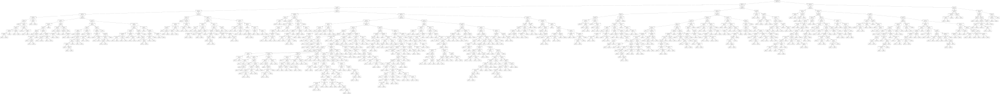

In [84]:
from graphviz import Source
from sklearn import tree
Source( tree.export_graphviz(dt, out_file=None, feature_names=X.columns))

#### b. validating: 1: 10 fold cross validation

In [85]:
# evaluate the decision tree model using 10-fold cross-validation
# initialize decision tree algorithm (without fitting)

scores = cross_val_score(DecisionTreeClassifier(), X, y, scoring='accuracy', cv=10)
print(scores)
print(scores.mean())

[0.62318841 0.5942029  0.64596273 0.69151139 0.61954262 0.65280665
 0.64864865 0.5966736  0.57620042 0.53653445]
0.6185271806402787


In [86]:
#The mean score and the 95% confidence interval of the score estimate are hence given by:
print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

Accuracy: 0.62 (+/- 0.08)


### 2.2.3 KNN

#### a. Model Building & Evaluation

In [87]:
# split validation
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize DecisionTreeClassifier() ... name your decision model "dt"
knn = KNeighborsClassifier()

# Train a decision tree model
knn = knn.fit(X_train, y_train)

knn

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

In [88]:
#Model evaluation

print(metrics.accuracy_score(y_test, knn.predict(X_test)))
print("--------------------------------------------------------")
print(metrics.confusion_matrix(y_test, knn.predict(X_test))) 
print("--------------------------------------------------------")
print(metrics.classification_report(y_test, knn.predict(X_test)))


0.5916955017301038
--------------------------------------------------------
[[122   5   2 283]
 [ 13   1   0  24]
 [  8   0   3  50]
 [186   8  11 729]]
--------------------------------------------------------
              precision    recall  f1-score   support

          OK       0.37      0.30      0.33       412
         bad       0.07      0.03      0.04        38
   excellent       0.19      0.05      0.08        61
        good       0.67      0.78      0.72       934

    accuracy                           0.59      1445
   macro avg       0.33      0.29      0.29      1445
weighted avg       0.55      0.59      0.56      1445



This model is 59.17% accurate.

#### b. validating: 1: 10 fold cross validation

In [89]:
# evaluate the knn model using 10-fold cross-validation

scores = cross_val_score(KNeighborsClassifier(), X, y, scoring='accuracy', cv=10)
print(scores)
print(scores.mean())

[0.51759834 0.51552795 0.47619048 0.4989648  0.40540541 0.44906445
 0.45530146 0.46361746 0.4217119  0.52609603]
0.4729478280081893


#### c. GridSearch

In [90]:
#create a dictionary of all values we want to test for n_neighbors
params_knn = {'n_neighbors': np.arange(1, 25)}

#use gridsearch to test all values for n_neighbors
knn_gs = GridSearchCV(knn, params_knn, cv=5, iid=False)

#fit model to training data
knn_gs.fit(X_train, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                            metric='minkowski',
                                            metric_params=None, n_jobs=None,
                                            n_neighbors=5, p=2,
                                            weights='uniform'),
             iid=False, n_jobs=None,
             param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [91]:
#save best model
knn_best = knn_gs.best_estimator_

#check best n_neigbors value
print(knn_gs.best_score_)
print(knn_gs.best_params_)
print(knn_gs.best_estimator_)

0.6200775834814868
{'n_neighbors': 23}
KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=23, p=2,
                     weights='uniform')


In [92]:
knn = KNeighborsClassifier(n_neighbors = 5)
knn = knn.fit(X_train, y_train)
knn

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

### 2.2.4 Logistic regression

#### a. Model Building & Evaluation

In [93]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
lr = LogisticRegression(solver='lbfgs', max_iter=500)
lr=lr.fit(X_train, y_train)
lr

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=500,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [94]:
#Model evaluation

print(metrics.accuracy_score(y_test, lr.predict(X_test)))
print("--------------------------------------------------------")
print(metrics.confusion_matrix(y_test, lr.predict(X_test))) 
print("--------------------------------------------------------")
print(metrics.classification_report(y_test, lr.predict(X_test)))

0.6442906574394464
--------------------------------------------------------
[[ 39   0   0 366]
 [ 18   0   0  38]
 [  2   0  22  27]
 [ 58   0   5 870]]
--------------------------------------------------------
              precision    recall  f1-score   support

          OK       0.33      0.10      0.15       405
         bad       0.00      0.00      0.00        56
   excellent       0.81      0.43      0.56        51
        good       0.67      0.93      0.78       933

    accuracy                           0.64      1445
   macro avg       0.45      0.37      0.37      1445
weighted avg       0.55      0.64      0.56      1445



This model is 64.43% accurate.

In [95]:
# generate class probabilities
probs = lr.predict_proba(X_test)
print(probs)
#1st column: probability of NOT left workplace
#2nd column: probabiility of lefting workplace

[[0.31216207 0.02133022 0.03148518 0.63502253]
 [0.31823566 0.02263722 0.03384086 0.62528626]
 [0.46171653 0.08238398 0.01072248 0.445177  ]
 ...
 [0.09600734 0.00131157 0.06924472 0.83343637]
 [0.10755515 0.00127589 0.03532112 0.85584785]
 [0.44782931 0.06288903 0.01917232 0.47010934]]


#### b. validating: 1: 10 fold cross validation

In [96]:
# evaluate the logit model using 10-fold cross-validation

scores = cross_val_score(LogisticRegression(solver='lbfgs', max_iter=500), X, y, scoring='accuracy', cv=10)
print(scores)
print(scores.mean())

[0.63354037 0.66252588 0.6563147  0.65217391 0.65696466 0.65280665
 0.64033264 0.64656965 0.64300626 0.59707724]
0.6441311969404917


### 2.2.5 Random Forest Classifier

#### a. Model Building & Evaluation

In [97]:
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier(n_estimators=20)    #building 20 decision trees
clf=clf.fit(X_train, y_train)
clf.score(X_test, y_test)

0.7342560553633218

In [98]:
#Model evaluation

print(metrics.accuracy_score(y_test, clf.predict(X_test)))
print("--------------------------------------------------------")
print(metrics.confusion_matrix(y_test, clf.predict(X_test))) 
print("--------------------------------------------------------")
print(metrics.classification_report(y_test, clf.predict(X_test)))

0.7342560553633218
--------------------------------------------------------
[[215   0   0 190]
 [ 42   1   0  13]
 [  0   0  36  15]
 [119   2   3 809]]
--------------------------------------------------------
              precision    recall  f1-score   support

          OK       0.57      0.53      0.55       405
         bad       0.33      0.02      0.03        56
   excellent       0.92      0.71      0.80        51
        good       0.79      0.87      0.83       933

    accuracy                           0.73      1445
   macro avg       0.65      0.53      0.55      1445
weighted avg       0.71      0.73      0.72      1445



This model is 73.43% accurate.

#### b. validating: 1: 10 fold cross validation

In [99]:
# evaluate the logit model using 10-fold cross-validation

scores = cross_val_score(RandomForestClassifier(), X, y, scoring='accuracy', cv=10)
print(scores)
print(scores.mean())

[0.67701863 0.72670807 0.70393375 0.79710145 0.76299376 0.71309771
 0.7027027  0.7006237  0.66388309 0.57411273]
0.7022175608814439


### 2.2.6 SelectKBest (feature selection)

In [100]:
X_new = SelectKBest(chi2, k=4).fit_transform(X, y)
print(X_new)

[[7.60505847e+08 8.86204000e+05 2.37000000e+08 3.30000000e+04]
 [3.09404152e+08 4.71220000e+05 3.00000000e+08 0.00000000e+00]
 [2.00074175e+08 2.75868000e+05 2.45000000e+08 8.50000000e+04]
 ...
 [4.83256489e+07 3.80000000e+01 1.40000000e+03 1.60000000e+01]
 [1.04430000e+04 1.25500000e+03 3.97478700e+07 6.60000000e+02]
 [8.52220000e+04 4.28500000e+03 1.10000000e+03 4.56000000e+02]]


In [101]:
selector = SelectKBest(chi2, k=4).fit(X, y)
idxs_selected = selector.get_support(indices=True)
print(idxs_selected)

[ 4  5  9 13]


In [102]:
X.head(1)

,num_critic_for_reviews,duration,director_facebook_likes,actor_1_facebook_likes,gross,num_voted_users,cast_total_facebook_likes,facenumber_in_poster,num_user_for_reviews,budget,title_year,actor_2_facebook_likes,aspect_ratio,movie_facebook_likes
0,723.0,178.0,0.0,1000.0,760505847.0,886204,4834,0.0,3054.0,237000000.0,2009.0,936.0,1.78,33000


So, we can find that gross, num_voted_users, budget, movie_facebook_likes are selected as four best predictors.

In [103]:
# Build a decision tree model with those four features ... Split validation:train (70%) and test sets (30%)
X_train, X_test, y_train, y_test = train_test_split(X_new, y, test_size=0.3, random_state=42)

# Initialize decisiontreeclassifier()
dt = DecisionTreeClassifier()

# Train the model
dt = dt.fit(X_train, y_train)



#Model evaluation
print(metrics.accuracy_score(y_test, dt.predict(X_test)))
print("--------------------------------------------------------")
print(metrics.confusion_matrix(y_test, dt.predict(X_test))) 
print("--------------------------------------------------------")
print(metrics.classification_report(y_test, dt.predict(X_test)))

0.6193771626297578
--------------------------------------------------------
[[194  29   2 187]
 [ 11   6   0  21]
 [  2   1  33  25]
 [214  26  32 662]]
--------------------------------------------------------
              precision    recall  f1-score   support

          OK       0.46      0.47      0.47       412
         bad       0.10      0.16      0.12        38
   excellent       0.49      0.54      0.52        61
        good       0.74      0.71      0.72       934

    accuracy                           0.62      1445
   macro avg       0.45      0.47      0.46      1445
weighted avg       0.63      0.62      0.63      1445



This model is 60.42% accurate.

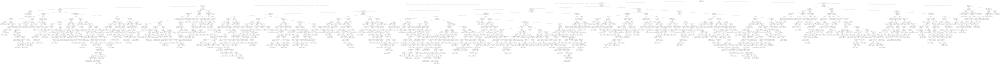

In [104]:
# visualizing the new decision tree

from graphviz import Source  
from sklearn import tree

X_new_df = pd.DataFrame(X_new)
X_new_df = X_new_df.rename(columns={0: 'gross', 1: 'num_voted_users', 2: 'budget', 3: 'movie_facebook_likes'})
Source(tree.export_graphviz(dt, out_file=None, feature_names=X_new_df.columns))

In [105]:
from sklearn.externals.six import StringIO
import pydotplus

dot_data = StringIO() 
tree.export_graphviz(dt, out_file=dot_data, feature_names=X_new_df.columns,
                     filled=True, rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_pdf("data/dt1.pdf")

True

In [106]:
# develop logistic regression model with X_new (only three predictors or independent variables)

X_train, X_test, y_train, y_test = train_test_split(X_new, y, test_size=0.3, random_state=0)
lr = LogisticRegression(solver='lbfgs', max_iter=500)
lr.fit(X_train, y_train)

#Model evaluation

print(metrics.accuracy_score(y_test, lr.predict(X_test)))
print(metrics.confusion_matrix(y_test, lr.predict(X_test)))
print(metrics.classification_report(y_test, lr.predict(X_test)))

0.6235294117647059
[[ 41   0   4 360]
 [ 20   0   1  35]
 [  2   0  24  25]
 [ 49   0  48 836]]
              precision    recall  f1-score   support

          OK       0.37      0.10      0.16       405
         bad       0.00      0.00      0.00        56
   excellent       0.31      0.47      0.37        51
        good       0.67      0.90      0.76       933

    accuracy                           0.62      1445
   macro avg       0.34      0.37      0.32      1445
weighted avg       0.54      0.62      0.55      1445



This model is 62.35% accurate.

### 2.2.7 Recursive Feature Selection (RFE)

In [107]:
model = LogisticRegression()
rfe = RFE(model, 5)  #asking five best attributes
rfe = rfe.fit(X, y)
# summarize the selection of the attributes
print((rfe.support_))
print((rfe.ranking_))

[ True  True False False False False False  True  True False False False
  True False]
[ 1  1  3  5 10  8  6  1  1  9  2  4  1  7]


In [108]:
# Features sorted by their rank
pd.DataFrame({'feature':X.columns, 'importance':rfe.ranking_})

,feature,importance
0,num_critic_for_reviews,1
1,duration,1
2,director_facebook_likes,3
3,actor_1_facebook_likes,5
4,gross,10
5,num_voted_users,8
6,cast_total_facebook_likes,6
7,facenumber_in_poster,1
8,num_user_for_reviews,1
9,budget,9


So, num_critic_for_reviews, duration, facenumber_in_poster, num_user_for_reviews, aspect_ratio are selected as five best predictors.

In [109]:
X_logistic = df2[['num_critic_for_reviews', 'duration', 'facenumber_in_poster', 'num_user_for_reviews', 'aspect_ratio']]
print(X_logistic.head())

   num_critic_for_reviews  duration  facenumber_in_poster  \
0                   723.0     178.0                   0.0   
1                   302.0     169.0                   0.0   
2                   602.0     148.0                   1.0   
3                   813.0     164.0                   0.0   
5                   462.0     132.0                   1.0   

   num_user_for_reviews  aspect_ratio  
0                3054.0          1.78  
1                1238.0          2.35  
2                 994.0          2.35  
3                2701.0          2.35  
5                 738.0          2.35  


In [110]:
# develop logistic regression model with X_logistic
X_train, X_test, y_train, y_test = train_test_split(X_logistic, y, test_size=0.3, random_state=0)
lr = LogisticRegression()
lr.fit(X_train, y_train)

#Model evaluation
print(metrics.accuracy_score(y_test, lr.predict(X_test)))
print(metrics.confusion_matrix(y_test, lr.predict(X_test)))
print(metrics.classification_report(y_test, lr.predict(X_test)))

0.6387543252595156
[[ 38   0   0 367]
 [ 16   0   0  40]
 [  1   0   2  48]
 [ 44   0   6 883]]
              precision    recall  f1-score   support

          OK       0.38      0.09      0.15       405
         bad       0.00      0.00      0.00        56
   excellent       0.25      0.04      0.07        51
        good       0.66      0.95      0.78       933

    accuracy                           0.64      1445
   macro avg       0.32      0.27      0.25      1445
weighted avg       0.54      0.64      0.55      1445



This model is 63.88% accurate.

### 2.2.8 ExtraTreesClassifier

In [111]:
model_extra = ExtraTreesClassifier()
model_extra.fit(X, y)
print(model_extra.score(X, y))

# display the relative importance of each attribute
print((model_extra.feature_importances_))

1.0
[0.08431158 0.0879137  0.06122553 0.05546851 0.07867712 0.1124679
 0.05968376 0.04975029 0.08050745 0.07806805 0.0843317  0.06543487
 0.03822163 0.06393789]


In [112]:
print("Features sorted by their rank:")
print(sorted(zip([round(x, 4) for x in model_extra.feature_importances_], X.columns)))

Features sorted by their rank:
[(0.0382, 'aspect_ratio'), (0.0498, 'facenumber_in_poster'), (0.0555, 'actor_1_facebook_likes'), (0.0597, 'cast_total_facebook_likes'), (0.0612, 'director_facebook_likes'), (0.0639, 'movie_facebook_likes'), (0.0654, 'actor_2_facebook_likes'), (0.0781, 'budget'), (0.0787, 'gross'), (0.0805, 'num_user_for_reviews'), (0.0843, 'num_critic_for_reviews'), (0.0843, 'title_year'), (0.0879, 'duration'), (0.1125, 'num_voted_users')]


In [113]:
pd.DataFrame(model_extra.feature_importances_, index = X.columns,
                                    columns=['importance']).sort_values('importance', ascending=False)

,importance
num_voted_users,0.112468
duration,0.087914
title_year,0.084332
num_critic_for_reviews,0.084312
num_user_for_reviews,0.080507
gross,0.078677
budget,0.078068
actor_2_facebook_likes,0.065435
movie_facebook_likes,0.063938
director_facebook_likes,0.061226


So, num_voted_users, num_critic_for_reviews, duration, title_year, num_user_for_reviews are selected as five best predictors.

### 2.2.9 Conclusion

1. Model Selection

    1) The Random Forest Classifier (Ensemble model) should be my best model. To improve the accuracy of model, we build 20 decision trees which means ombining 20 different opionions.
    
    2) The Random Forest Classifier is 73.43% accurate which is the highest accuracy during all models we build. The mean 10 folder cross validation score is 0.6943 which is the highest score.
2. Discussion
    
    1) Important variables to predict IMDB score of movies: num_critic_for_reviews, duration, num_user_for_reviews, title_year, num_voted_users.
    
    2) The importance of 'num_critic_for_reviews' is 0.086438; The importance of 'duration' is 0.085983; The importance of 'num_user_for_reviews' is 0.077796; The importance of 'title_year' is 0.080630; The importance of 'num_voted_users' is 0.114096.

### 2.2.10 Extra points

In [114]:
df5 = df.drop(['profit','return','imdb_score'], axis=1)
df5 = df5.drop(['director_name', 'actor_2_name', 'genres', 'actor_1_name', 'movie_title', 'actor_3_name', 'movie_imdb_link', 'country', 'content_rating'], axis=1)

In [115]:
df5.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4814 entries, 0 to 5042
Data columns (total 15 columns):
num_critic_for_reviews       4814 non-null float64
duration                     4814 non-null float64
director_facebook_likes      4814 non-null float64
actor_1_facebook_likes       4814 non-null float64
gross                        4814 non-null float64
num_voted_users              4814 non-null int64
cast_total_facebook_likes    4814 non-null int64
facenumber_in_poster         4814 non-null float64
num_user_for_reviews         4814 non-null float64
budget                       4814 non-null float64
title_year                   4814 non-null float64
actor_2_facebook_likes       4814 non-null float64
aspect_ratio                 4814 non-null float64
movie_facebook_likes         4814 non-null int64
imdbscores_bins              4814 non-null category
dtypes: category(1), float64(11), int64(3)
memory usage: 569.0 KB


In [116]:
df5 = df5.drop(['imdbscores_bins'],axis = 1)

In [117]:
# save data
df5.to_csv("imdb_score_testing.csv",index=False)

In [118]:
# scoring dataset
score=pd.read_csv("imdb_score_testing.csv")
score.head(2)

,num_critic_for_reviews,duration,director_facebook_likes,actor_1_facebook_likes,gross,num_voted_users,cast_total_facebook_likes,facenumber_in_poster,num_user_for_reviews,budget,title_year,actor_2_facebook_likes,aspect_ratio,movie_facebook_likes
0,723.0,178.0,0.0,1000.0,760505847.0,886204,4834,0.0,3054.0,237000000.0,2009.0,936.0,1.78,33000
1,302.0,169.0,563.0,40000.0,309404152.0,471220,48350,0.0,1238.0,300000000.0,2007.0,5000.0,2.35,0


In [119]:
# deploy your model for real world

predictedY = clf.predict(score)
print(predictedY)

['good' 'good' 'good' ... 'good' 'good' 'good']


In [120]:
output_scoring = clf.predict(score)
predicted_y= pd.DataFrame(output_scoring, columns=['Predicted imdb score'])
predicted_y

,Predicted imdb score
0,good
1,good
2,good
3,excellent
4,good
5,good
6,good
7,good
8,good
9,excellent


In [121]:
probs = clf.predict_proba(score)
probs = pd.DataFrame(probs, columns=['prob of OK', 'prob of bad','prob of excellent', 'prob of good'])
probs

,prob of OK,prob of bad,prob of excellent,prob of good
0,0.05,0.00,0.30,0.65
1,0.20,0.00,0.15,0.65
2,0.00,0.00,0.05,0.95
3,0.00,0.00,1.00,0.00
4,0.15,0.00,0.05,0.80
5,0.00,0.00,0.05,0.95
6,0.00,0.00,0.00,1.00
7,0.00,0.00,0.15,0.85
8,0.10,0.00,0.05,0.85
9,0.00,0.00,0.60,0.40


In [122]:
predicted_imdbscore = predicted_y.join(probs)
predicted_imdbscore

,Predicted imdb score,prob of OK,prob of bad,prob of excellent,prob of good
0,good,0.05,0.00,0.30,0.65
1,good,0.20,0.00,0.15,0.65
2,good,0.00,0.00,0.05,0.95
3,excellent,0.00,0.00,1.00,0.00
4,good,0.15,0.00,0.05,0.80
5,good,0.00,0.00,0.05,0.95
6,good,0.00,0.00,0.00,1.00
7,good,0.00,0.00,0.15,0.85
8,good,0.10,0.00,0.05,0.85
9,excellent,0.00,0.00,0.60,0.40


This table shows the predicted imdb scores of each movies.

## 2.3 Clustering analysis 

In [123]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.cluster import KMeans

from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import pairwise_distances

from sklearn.cluster import ward_tree
from scipy.cluster.hierarchy import dendrogram, linkage, ward

In [124]:
df1 = df.drop(['profit','return','imdbscores_bins'], axis=1)
df1 = df1.drop(['director_name', 'actor_2_name', 'genres', 'actor_1_name', 'movie_title', 'actor_3_name', 'movie_imdb_link', 'country', 'content_rating'], axis=1)

In [125]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4814 entries, 0 to 5042
Data columns (total 15 columns):
num_critic_for_reviews       4814 non-null float64
duration                     4814 non-null float64
director_facebook_likes      4814 non-null float64
actor_1_facebook_likes       4814 non-null float64
gross                        4814 non-null float64
num_voted_users              4814 non-null int64
cast_total_facebook_likes    4814 non-null int64
facenumber_in_poster         4814 non-null float64
num_user_for_reviews         4814 non-null float64
budget                       4814 non-null float64
title_year                   4814 non-null float64
actor_2_facebook_likes       4814 non-null float64
imdb_score                   4814 non-null float64
aspect_ratio                 4814 non-null float64
movie_facebook_likes         4814 non-null int64
dtypes: float64(12), int64(3)
memory usage: 601.8 KB


### 2.3.1 variance analysis

In [126]:
df1.var()

num_critic_for_reviews       1.469663e+04
duration                     5.063504e+02
director_facebook_likes      8.088358e+06
actor_1_facebook_likes       2.336704e+08
gross                        3.932885e+15
num_voted_users              1.951875e+10
cast_total_facebook_likes    3.398815e+08
facenumber_in_poster         4.020240e+00
num_user_for_reviews         1.455529e+05
budget                       4.011332e+16
title_year                   1.556280e+02
actor_2_facebook_likes       1.676463e+07
imdb_score                   1.227986e+00
aspect_ratio                 4.775277e-01
movie_facebook_likes         3.771247e+08
dtype: float64

### 2.3.2 Normalize data & Check variance again

In [127]:
# normalize data and save as X

X = (df1 - df1.mean()) / (df1.max() - df1.min())
X.head()

,num_critic_for_reviews,duration,director_facebook_likes,actor_1_facebook_likes,gross,num_voted_users,cast_total_facebook_likes,facenumber_in_poster,num_user_for_reviews,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
0,0.714592,0.220321,-0.030414,-0.008967,0.936295,0.473689,-0.007773,-0.031633,0.548637,0.016117,0.06635,-0.005470,0.192588,-0.023399,0.072729
1,0.196119,0.191840,-0.005936,0.051970,0.343134,0.228102,0.058489,-0.031633,0.189673,0.021275,0.04635,0.024194,0.088692,0.015063,-0.021827
2,0.565577,0.125385,-0.030414,0.006658,0.199375,0.112492,0.002682,-0.008377,0.141442,0.016772,0.12635,-0.009434,0.049730,0.015063,0.221726
3,0.825429,0.176017,0.926108,0.031658,0.525548,0.626453,0.147428,-0.031633,0.478860,0.017182,0.09635,0.155581,0.270510,0.015063,0.448087
5,0.393163,0.074752,-0.009762,-0.009530,0.032360,0.074816,-0.012281,-0.008377,0.090839,0.018303,0.09635,-0.007689,0.023756,0.015063,0.046941


In [128]:
# variance test again

X.var()

num_critic_for_reviews       0.022290
duration                     0.005071
director_facebook_likes      0.015290
actor_1_facebook_likes       0.000570
gross                        0.006800
num_voted_users              0.006836
cast_total_facebook_likes    0.000788
facenumber_in_poster         0.002174
num_user_for_reviews         0.005687
budget                       0.000269
title_year                   0.015563
actor_2_facebook_likes       0.000893
imdb_score                   0.020712
aspect_ratio                 0.002174
movie_facebook_likes         0.003096
dtype: float64

### 2.3.3 Clustering analysis (k = 3)

In [129]:
#four clusters

k_means = KMeans(init='k-means++', n_clusters=3, random_state=0)

In [130]:
k_means.fit(X)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

In [131]:
#clustering results

k_means.labels_

array([2, 2, 2, ..., 0, 0, 0])

In [132]:
#cluster centers

k_means.cluster_centers_

array([[-0.06756803, -0.01214486, -0.02523446, -0.00264737, -0.02094549,
        -0.03061545, -0.00396389,  0.00079673, -0.02524747, -0.00099247,
        -0.01189884, -0.00424629, -0.03421584, -0.00082764, -0.01710988],
       [ 0.10924138,  0.05103505,  0.60823358,  0.00984915,  0.05083573,
         0.10252484,  0.01458602, -0.00850593,  0.06978398,  0.00075976,
        -0.04609422,  0.0145772 ,  0.10903785, -0.00099237,  0.03448519],
       [ 0.19143179,  0.02942   , -0.01865506,  0.00661572,  0.05664583,
         0.07831441,  0.00993123, -0.00111057,  0.06692877,  0.00294606,
         0.04409074,  0.01080527,  0.08840497,  0.00271508,  0.04739131]])

In [133]:
#To add cluster label into the dataset as a column

dfc = pd.DataFrame(k_means.labels_, columns = ['cluster'])
dfc.head()

,cluster
0,2
1,2
2,2
3,1
4,2


In [134]:
df = df.reset_index(drop=True)
dfc = dfc.reset_index(drop=True)

df_ = df.join(dfc)
df_.head()

,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,actor_1_name,movie_title,...,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes,profit,return,imdbscores_bins,cluster
0,James Cameron,723.0,178.0,0.0,Joel David Moore,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,CCH Pounder,Avatar,...,237000000.0,2009.0,936.0,7.9,1.78,33000,523505847.0,220.888543,good,2
1,Gore Verbinski,302.0,169.0,563.0,Orlando Bloom,40000.0,309404152.0,Action|Adventure|Fantasy,Johnny Depp,Pirates of the Caribbean: At World's End,...,300000000.0,2007.0,5000.0,7.1,2.35,0,9404152.0,3.134717,good,2
2,Sam Mendes,602.0,148.0,0.0,Rory Kinnear,11000.0,200074175.0,Action|Adventure|Thriller,Christoph Waltz,Spectre,...,245000000.0,2015.0,393.0,6.8,2.35,85000,-44925825.0,-18.337071,good,2
3,Christopher Nolan,813.0,164.0,22000.0,Christian Bale,27000.0,448130642.0,Action|Thriller,Tom Hardy,The Dark Knight Rises,...,250000000.0,2012.0,23000.0,8.5,2.35,164000,198130642.0,79.252257,excellent,1
4,Andrew Stanton,462.0,132.0,475.0,Samantha Morton,640.0,73058679.0,Action|Adventure|Sci-Fi,Daryl Sabara,John Carter,...,263700000.0,2012.0,632.0,6.6,2.35,24000,-190641321.0,-72.294775,good,2


In [135]:
df_.tail()

,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,actor_1_name,movie_title,...,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes,profit,return,imdbscores_bins,cluster
4809,Edward Burns,14.0,95.0,0.0,Caitlin FitzGerald,296.0,4.584000e+03,Comedy|Drama,Kerry Bishé,Newlyweds,...,9.000000e+03,2011.0,205.0,6.4,2.221417,413,-4.416000e+03,-4.906667e+01,good,0
4810,Scott Smith,1.0,87.0,2.0,Daphne Zuniga,637.0,4.832565e+07,Comedy|Drama,Eric Mabius,Signed Sealed Delivered,...,3.974787e+07,2013.0,470.0,7.7,2.221417,84,8.577779e+06,2.158047e+01,good,0
4811,Benjamin Roberds,13.0,76.0,0.0,Maxwell Moody,0.0,4.832565e+07,Drama|Horror|Thriller,Eva Boehnke,A Plague So Pleasant,...,1.400000e+03,2013.0,0.0,6.3,2.221417,16,4.832425e+07,3.451732e+06,good,0
4812,Daniel Hsia,14.0,100.0,0.0,Daniel Henney,946.0,1.044300e+04,Comedy|Drama|Romance,Alan Ruck,Shanghai Calling,...,3.974787e+07,2012.0,719.0,6.3,2.350000,660,-3.973743e+07,-9.997373e+01,good,0
4813,Jon Gunn,43.0,90.0,16.0,Brian Herzlinger,86.0,8.522200e+04,Documentary,John August,My Date with Drew,...,1.100000e+03,2004.0,23.0,6.6,1.850000,456,8.412200e+04,7.647455e+03,good,0


### 2.3.4 Interpretation of Clustering Analysis

In [136]:
df_.groupby(['cluster']).size()

cluster
0    3500
1     180
2    1134
dtype: int64

These are 3500 observations in cluster 0, 180 observations in cluster 1, and 1134 observations in cluster 2.

In [137]:
df_.groupby('cluster').mean()

,num_critic_for_reviews,duration,director_facebook_likes,actor_1_facebook_likes,gross,num_voted_users,cast_total_facebook_likes,facenumber_in_poster,num_user_for_reviews,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes,profit,return
cluster,,,,,,,,,,,,,,,,,
0,87.838857,104.538286,119.101714,5046.058857,3.252552e+07,34041.994000,7337.356571,1.394571,150.649143,2.799325e+07,2001.173143,1103.989429,6.153657,2.114438,1646.618000,4.532271e+06,2750.266775
1,231.455556,124.505556,14688.888889,13042.438889,8.710939e+07,259025.211111,19517.650000,0.994444,631.483333,4.939821e+07,1997.755556,3682.522222,7.256667,2.112063,19652.827778,3.771117e+07,330.032615
2,298.155203,117.671076,270.385362,10963.514109,9.145695e+07,217978.429453,16446.538801,1.312169,616.843915,7.606431e+07,2006.775132,3163.070547,7.096825,2.167169,24135.759259,1.539264e+07,1188.657326


1. The characters of the first cluster:
    - The mean values of num_critic_for_reviews, duration, director_facebook_likes, actor_1_facebook_likes, gross, num_voted_users, cast_total_facebook_likes, num_user_for_reviews, budget, actor_2_facebook_likes, imdb_score, movie_facebook_likes, profit are the lowest of these three clusters.
2. The characters of the second cluster:
    - The mean values of duration, director_facebook_likes, actor_1_facebook_likes, num_voted_users, cast_total_facebook_likes, num_user_for_reviews, actor_2_facebook_likes, imdb_score, profit are the highest of these three clusters.
    - The mean values of facenumber_in_poster, title_year, aspect_ratio, return are the lowest of these three clusters.
3. The characters of the third cluster:
    - The mean values of num_critic_for_reviews, gross, budget, title_year, aspect_ratio, movie_facebook_likes are the highest of these three clusters.

### 2.3.5 Build Decision Tree model

In [138]:
df_1 = df_.drop(['profit','return','imdbscores_bins'], axis=1)
df_1 = df_1.drop(['director_name', 'actor_2_name', 'genres', 'actor_1_name', 'movie_title', 'actor_3_name', 'movie_imdb_link', 'country', 'content_rating'], axis=1)

In [139]:
# set X and y

y = df_1['cluster'].values
X = df_1.drop(['cluster'], axis=1)

In [140]:
# instantiate a decision tree model, and fit with X and y
model = DecisionTreeClassifier()

model = model.fit(X, y)    # without model validation since this model is not for prediction, but for explanation

# check the accuracy on the training set
model.score(X, y)

1.0

In [141]:
predicted_Y = model.predict(X)
print(predicted_Y)

[2 2 2 ... 0 0 0]


In [142]:
from sklearn.externals.six import StringIO
import pydotplus

dot_data = StringIO() 
tree.export_graphviz(model, out_file=dot_data, feature_names=X.columns,
                     filled=True, rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_pdf("model.pdf")
# go to data folder and open the pdf file

True

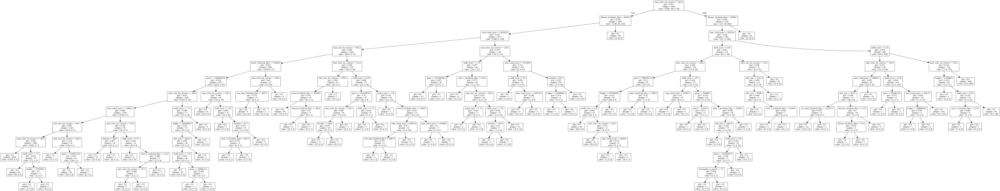

In [143]:
from graphviz import Source
from sklearn import tree
Source( tree.export_graphviz(model, out_file=None, feature_names=X.columns))

According to this decision tree, num_critic_for_reviews are considered most important in this clustering analysis.

### 2.3.6 Build randomforestclassifier model

In [144]:
# build randomforeastmodel

from sklearn.ensemble import RandomForestClassifier

clf1 = RandomForestClassifier(n_estimators=20)    #building 20 decision trees
clf1=clf.fit(X, y)
clf1.score(X,y)

1.0

In [145]:
pd.DataFrame({'feature':X.columns, 'importance':clf1.feature_importances_}).sort_values('importance', ascending=False)

,feature,importance
0,num_critic_for_reviews,0.296328
5,num_voted_users,0.204476
2,director_facebook_likes,0.120219
14,movie_facebook_likes,0.097975
8,num_user_for_reviews,0.094277
12,imdb_score,0.034572
4,gross,0.031806
10,title_year,0.025938
9,budget,0.021111
1,duration,0.018858


According to this feature importance chart, the most important variables in predicting are num_critic_for_reviews, num_voted_users, director_facebook_likes, movie_facebook_likes. And aspect_ratio is considered the least important variable.

### 2.3.7 AgglomerativeClustering

In [146]:
agg = AgglomerativeClustering(n_clusters=2, linkage='ward').fit(X)
agg.labels_

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

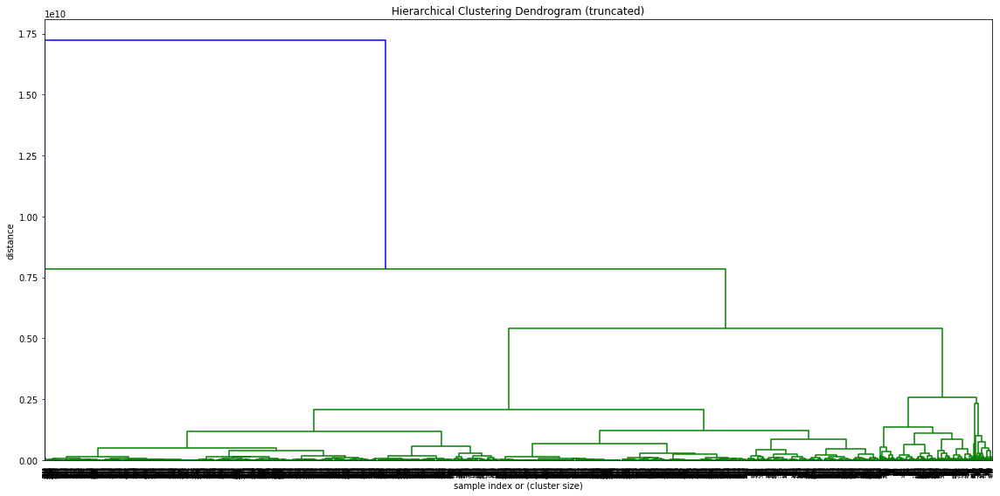

In [147]:
plt.figure(figsize=(16,8))

plt.title('Hierarchical Clustering Dendrogram (truncated)')
plt.xlabel('sample index or (cluster size)')
plt.ylabel('distance')

linkage_matrix = ward(X)
dendrogram(linkage_matrix, orientation="top")
plt.tight_layout() # fixes margins

In [148]:
#To add cluster label into the dataset as a column

df3 = pd.DataFrame(agg.labels_, columns = ['cluster'])
df3.head()

,cluster
0,0
1,0
2,0
3,0
4,0


In [149]:
df = df.reset_index(drop=True)
df3 = df3.reset_index(drop=True)

df4 = df.join(df3)
df4.head()

,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,actor_1_name,movie_title,...,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes,profit,return,imdbscores_bins,cluster
0,James Cameron,723.0,178.0,0.0,Joel David Moore,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,CCH Pounder,Avatar,...,237000000.0,2009.0,936.0,7.9,1.78,33000,523505847.0,220.888543,good,0
1,Gore Verbinski,302.0,169.0,563.0,Orlando Bloom,40000.0,309404152.0,Action|Adventure|Fantasy,Johnny Depp,Pirates of the Caribbean: At World's End,...,300000000.0,2007.0,5000.0,7.1,2.35,0,9404152.0,3.134717,good,0
2,Sam Mendes,602.0,148.0,0.0,Rory Kinnear,11000.0,200074175.0,Action|Adventure|Thriller,Christoph Waltz,Spectre,...,245000000.0,2015.0,393.0,6.8,2.35,85000,-44925825.0,-18.337071,good,0
3,Christopher Nolan,813.0,164.0,22000.0,Christian Bale,27000.0,448130642.0,Action|Thriller,Tom Hardy,The Dark Knight Rises,...,250000000.0,2012.0,23000.0,8.5,2.35,164000,198130642.0,79.252257,excellent,0
4,Andrew Stanton,462.0,132.0,475.0,Samantha Morton,640.0,73058679.0,Action|Adventure|Sci-Fi,Daryl Sabara,John Carter,...,263700000.0,2012.0,632.0,6.6,2.35,24000,-190641321.0,-72.294775,good,0


In [150]:
df4.groupby('cluster').mean()

,num_critic_for_reviews,duration,director_facebook_likes,actor_1_facebook_likes,gross,num_voted_users,cast_total_facebook_likes,facenumber_in_poster,num_user_for_reviews,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes,profit,return
cluster,,,,,,,,,,,,,,,,,
0,142.705797,108.378143,699.540619,6740.253688,4.845813e+07,85786.447746,9940.396219,1.360482,278.446084,3.758768e+07,2002.364222,1685.7139,6.416954,2.126828,7617.623727,1.087046e+07,2292.411588
1,363.000000,110.000000,584.000000,629.000000,2.201412e+06,68883.000000,1173.000000,0.000000,279.000000,1.221550e+10,2006.000000,398.0000,7.000000,1.850000,7000.000000,-1.221330e+10,-99.981979


### 2.3.8 Conclusion

1. K-Mean clustering analysis

    1) These are 3500 observations in cluster 0, 180 observations in cluster 1, and 1134 observations in cluster 2.

    2) The characters of the first cluster:
        The mean values of num_critic_for_reviews, duration, director_facebook_likes, actor_1_facebook_likes, gross, num_voted_users, cast_total_facebook_likes, num_user_for_reviews, budget, actor_2_facebook_likes, imdb_score, movie_facebook_likes, profit are the lowest of these three clusters.

    3) The characters of the second cluster:
        i. The mean values of duration, director_facebook_likes, actor_1_facebook_likes, num_voted_users, cast_total_facebook_likes, num_user_for_reviews, actor_2_facebook_likes, imdb_score, profit are the highest of these three clusters.
        ii. The mean values of facenumber_in_poster, title_year, aspect_ratio, return are the lowest of these three clusters.
    
    4) The characters of the third cluster:
        The mean values of num_critic_for_reviews, gross, budget, title_year, aspect_ratio, movie_facebook_likes are the highest of these three clusters.
2. Importance of variables
    1) According to this feature importance chart, the most important variables in predicting are num_critic_for_reviews, num_voted_users, director_facebook_likes, movie_facebook_likes.
    
    2) The importance of 'num_critic_for_reviews' is 0.247561; The importance of 'num_voted_users' is 0.234918; The importance of 'director_facebook_likes' is 0.136883; The importance of 'movie_facebook_likes' is 0.111333.

# 3. Final analysis & storytelling 

## 3.1 Regression analysis

1. Best model

    According to these four regression models, the best model is model1 whose R-squared is the largest. However, the R-squared of model1 is 0.334 which means only 33.4% of the response variable variation that is explained by a linear model, it is still too small. So, I can conclude that all regression models above are not good enough for predicting.

2. Important variables in predicting
    
    1) In my model, the most important three variables in predicting the housing prices in Boston are 'aspect_ratio', 'facenumber_in_poster' and 'duration'; 
    
    2) For every increase in 'aspect_ratio' we can expect 'imdb_score' to decrease by an average of 0.014;
    
    3) For every increase in 'facenumber_in_poster' we can expect 'imdb_score' to decrease by an average of 0.0265;
   
   4) For every increase in 'duration' we can expect 'imdb_score' to increase by an average of 0.0104;

## 3.2 Classification analysis

1. Model Selection

    1) The Random Forest Classifier (Ensemble model) should be my best model. To improve the accuracy of model, we build 20 decision trees which means ombining 20 different opionions.
    
    2) The Random Forest Classifier is 73.43% accurate which is the highest accuracy during all models we build. The mean 10 folder cross validation score is 0.6943 which is the highest score.
2. Important variables in predicting
    
    1) Important variables to predict IMDB score of movies: num_critic_for_reviews, duration, num_user_for_reviews, title_year, num_voted_users.
    
    2) The importance of 'num_critic_for_reviews' is 0.086438; The importance of 'duration' is 0.085983; The importance of 'num_user_for_reviews' is 0.077796; The importance of 'title_year' is 0.080630; The importance of 'num_voted_users' is 0.114096.

## 3.3 Clustering analysis

1. K-Mean clustering analysis

    1) These are 3500 observations in cluster 0, 180 observations in cluster 1, and 1134 observations in cluster 2.

    2) The characters of the first cluster:
        The mean values of num_critic_for_reviews, duration, director_facebook_likes, actor_1_facebook_likes, gross, num_voted_users, cast_total_facebook_likes, num_user_for_reviews, budget, actor_2_facebook_likes, imdb_score, movie_facebook_likes, profit are the lowest of these three clusters.

    3) The characters of the second cluster:
        i. The mean values of duration, director_facebook_likes, actor_1_facebook_likes, num_voted_users, cast_total_facebook_likes, num_user_for_reviews, actor_2_facebook_likes, imdb_score, profit are the highest of these three clusters.
        ii. The mean values of facenumber_in_poster, title_year, aspect_ratio, return are the lowest of these three clusters.
    
    4) The characters of the third cluster:
        The mean values of num_critic_for_reviews, gross, budget, title_year, aspect_ratio, movie_facebook_likes are the highest of these three clusters.
2. Importance of variables
    1) According to this feature importance chart, the most important variables in predicting are num_critic_for_reviews, num_voted_users, director_facebook_likes, movie_facebook_likes.
    
    2) The importance of 'num_critic_for_reviews' is 0.247561; The importance of 'num_voted_users' is 0.234918; The importance of 'director_facebook_likes' is 0.136883; The importance of 'movie_facebook_likes' is 0.111333.

Story telling: Overall suggestions and implications o What variables are considered important to predict imdb_score and movie success? o What recommendations do you have for movie producers / investors / viewers?  o What additional variables would you need to improve the model prediction? o Any other suggestion